# Stable Diffusion - image to image

## Installing the libraries

In [1]:
!pip install torch==1.13.1 torchvision==0.14.1 torchaudio==0.13.1 torchdata==0.5.1 torchtext==0.14.1

  Using cached torch-1.13.1-cp310-cp310-manylinux1_x86_64.whl.metadata (24 kB)
Using cached torch-1.13.1-cp310-cp310-manylinux1_x86_64.whl (887.5 MB)
  Attempting uninstall: torch
    Found existing installation: torch 2.4.0
    Uninstalling torch-2.4.0:
      Successfully uninstalled torch-2.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xformers 0.0.27.post2 requires torch==2.4.0, but you have torch 1.13.1 which is incompatible.

[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [2]:
!pip install -qqq git+https://github.com/huggingface/diffusers.git
!pip install -q accelerate transformers ftfy bitsandbytes==0.35.0 gradio natsort safetensors xformers

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 0.13.1 requires torch==1.13.1, but you have torch 2.4.0 which is incompatible.
torchdata 0.5.1 requires torch==1.13.1, but you have torch 2.4.0 which is incompatible.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 2.4.0 which is incompatible.
torchvision 0.14.1 requires torch==1.13.1, but you have torch 2.4.0 which is incompatible.

[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: pip install --upgrade pip


## Creating the pipeline

In [3]:
import torch
from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: libtorch_cuda_cu.so: cannot open shared object file: No such file or directory
  warn(f"Failed to load image Python extension: {e}")
2024-08-09 14:43:26.015153: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-09 14:43:26.786417: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/opt/conda/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xforme

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [4]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

In [5]:
seed = 777

## Loading the initial image


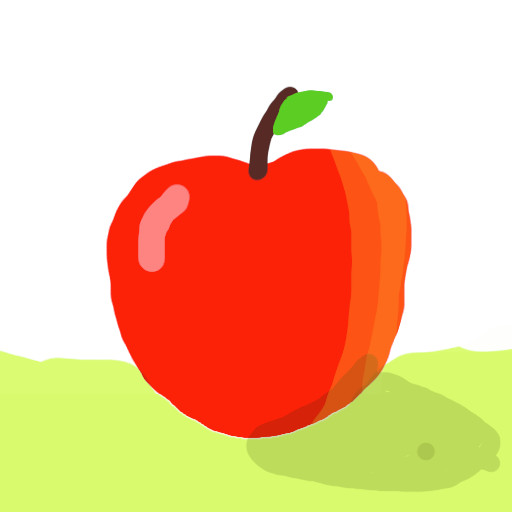

In [6]:
from PIL import Image
init_img = Image.open('./img/apple.jpg')
init_img.thumbnail((512, 512))
init_img

## Creating the prompt

In [7]:
prompt = 'photgraph of an apple'

## Generating the image


  0%|          | 0/40 [00:00<?, ?it/s]

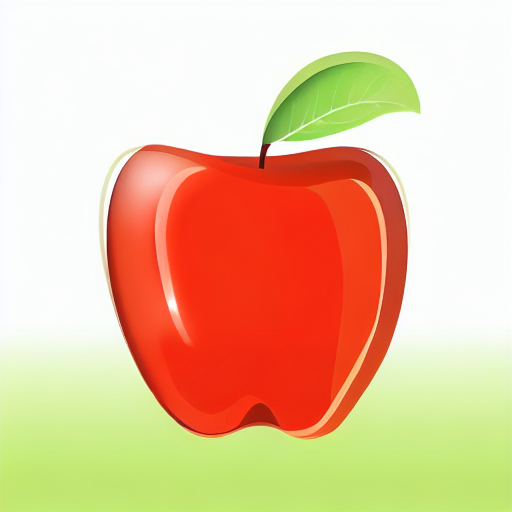

In [8]:
generator = torch.Generator(device = device).manual_seed(seed)
img = pipe(prompt = prompt, image = init_img, generator = generator).images[0]
img

  0%|          | 0/40 [00:00<?, ?it/s]

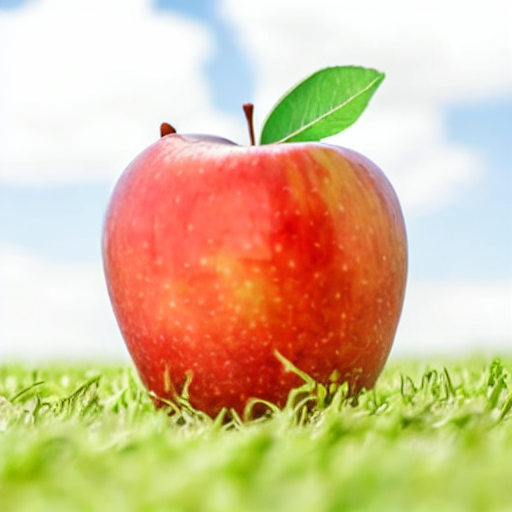

In [9]:
prompt = "photograph of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt=prompt, image=init_img, generator=generator).images[0]
img

  0%|          | 0/40 [00:00<?, ?it/s]

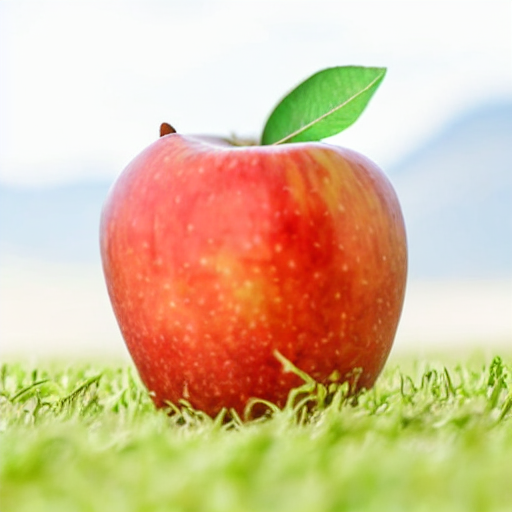

In [10]:
prompt = "photograph of an apple on a grass field, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt=prompt, image=init_img, generator=generator).images[0]
img

  0%|          | 0/40 [00:00<?, ?it/s]

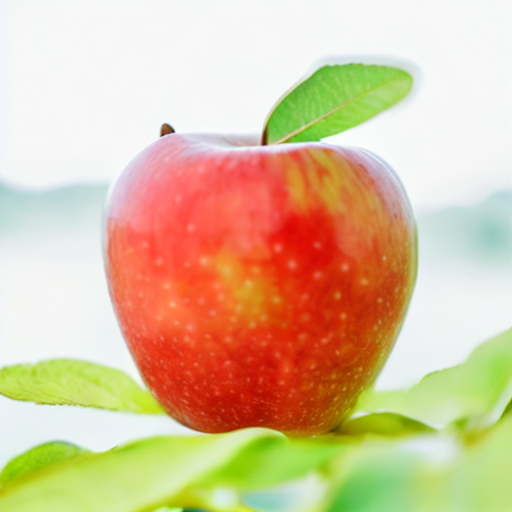

In [11]:
prompt = "photograph of an apple on a river"
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt=prompt, image=init_img, generator=generator).images[0]
img

## Strength parameter (intensity)

* The initial image will be used as a starting point.
* Value between 0.0 and 1.0 that controls the amount of noise added to the input image. Values close to 1 allow many variations, but will also produce images that are not so similar to the input image.
* The smaller the value, the closer to the input image it will be. The higher, the more freedom the AI will have to generate the image (more noise will be added).
* Default value is 0.8
* If strength = 1, the input image is ignored.

  0%|          | 0/42 [00:00<?, ?it/s]

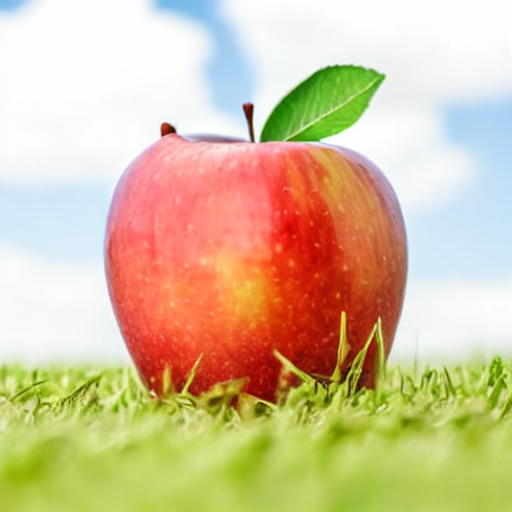

In [12]:
prompt = "photograph of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt = prompt, image=init_img, strength=0.85, generator=generator).images[0]
img

  0%|          | 0/37 [00:00<?, ?it/s]

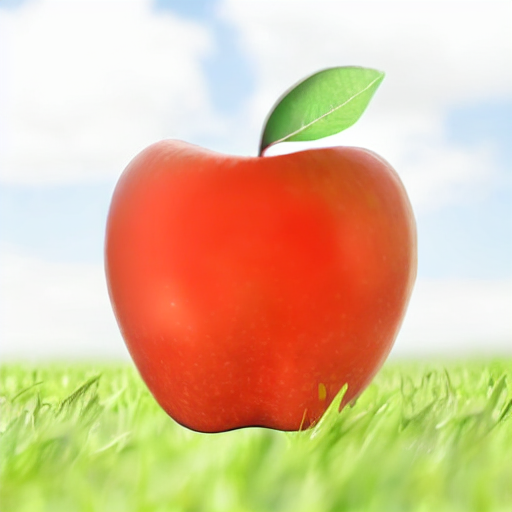

In [13]:
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt=prompt, image=init_img, strength=0.75, generator=generator).images[0]
img

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

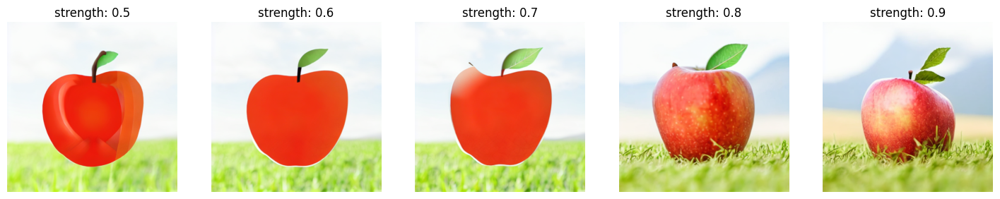

In [14]:
import matplotlib.pyplot as plt

prompt = "photograph of an apple on a grass field, mountains in the background"

plt.figure(figsize=(18,8))
for i in range(1, 6):

  strength_val = (i + 4) / 10
  generator = torch.Generator("cuda").manual_seed(seed)
  img = pipe(prompt, image=init_img, strength=strength_val, generator=generator).images[0]

  plt.subplot(1,5,i)
  plt.title('strength: {}'.format(strength_val))
  plt.imshow(img)
  plt.axis('off')

plt.show()

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

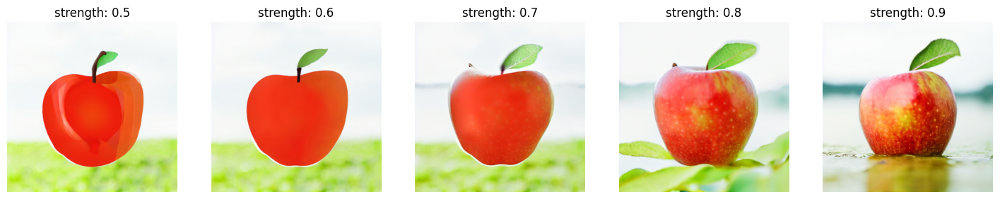

In [15]:
import matplotlib.pyplot as plt

prompt = "photograph of an apple on a river"

plt.figure(figsize=(18,8))
for i in range(1, 6):

  strength_val = (i + 4) / 10
  generator = torch.Generator("cuda").manual_seed(seed)
  img = pipe(prompt, image=init_img, strength=strength_val, generator=generator).images[0]

  plt.subplot(1,5,i)
  plt.title('strength: {}'.format(strength_val))
  plt.imshow(img)
  plt.axis('off')

plt.show()

## Testing different styles

  0%|          | 0/40 [00:00<?, ?it/s]

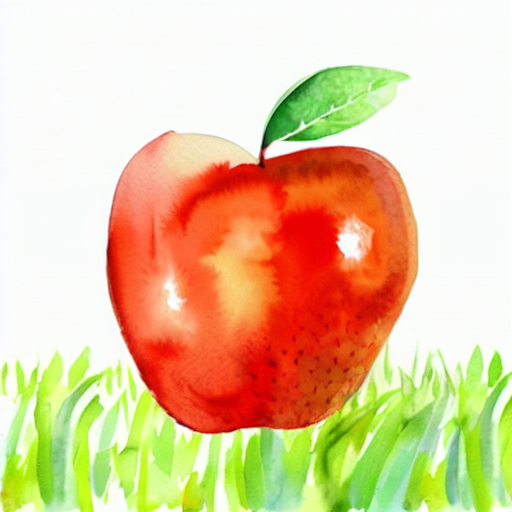

In [16]:
prompt = "watercolor painting of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

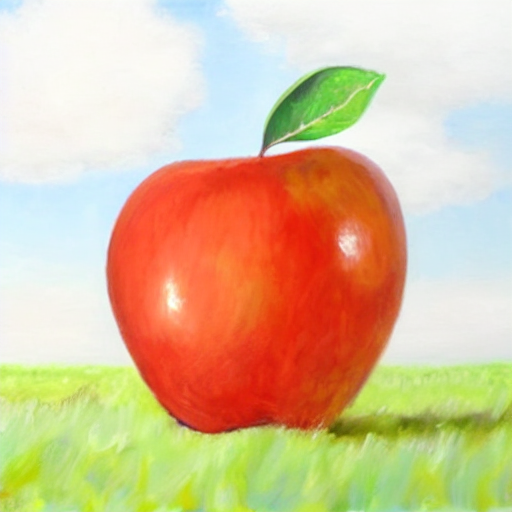

In [17]:
prompt = "oil painting of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

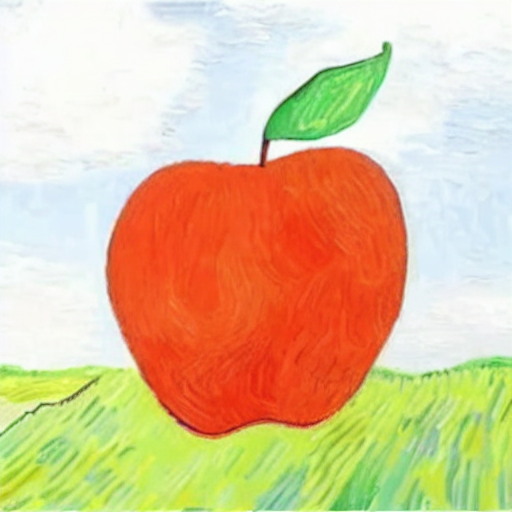

In [18]:
prompt = "painting of an apple on a grass field, blue sky and clouds in the background, van gogh style"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

## Changing the input image


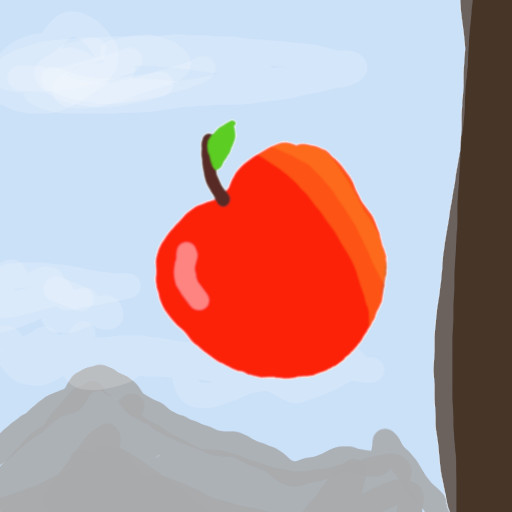

In [21]:
init_img = Image.open('./img/apple2.jpg')
init_img.thumbnail((512, 512))
init_img

  0%|          | 0/40 [00:00<?, ?it/s]

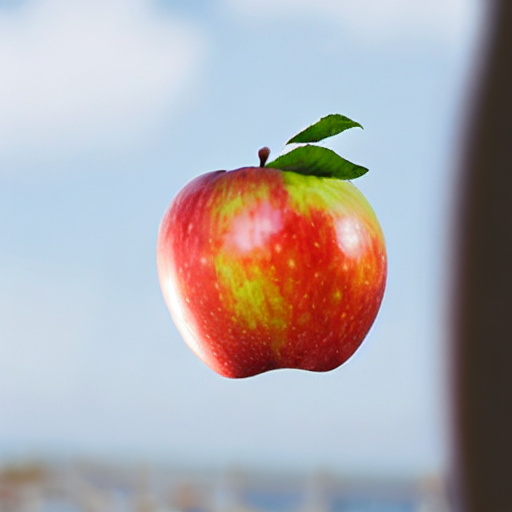

In [22]:
prompt = "photograph of an apple"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

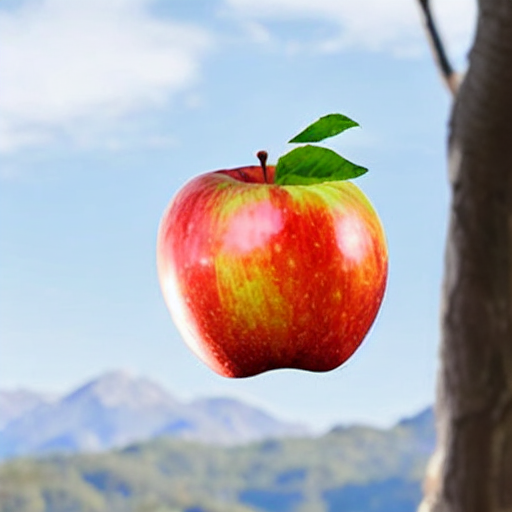

In [23]:
prompt = "photograph of an apple falling from a tree, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

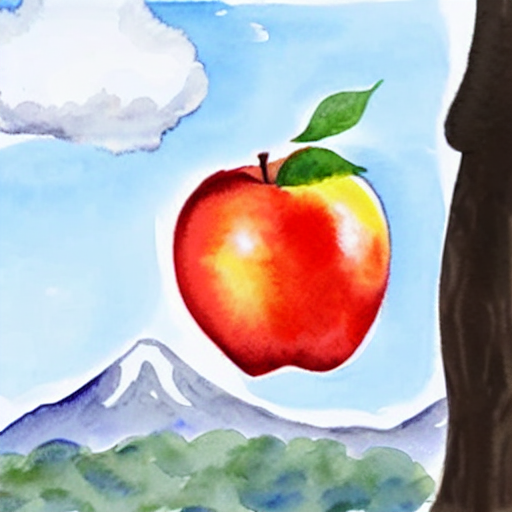

In [24]:
prompt = "watercolor painting of an apple falling from a tree, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

## Other models


In [25]:
modi = StableDiffusionImg2ImgPipeline.from_pretrained("nitrosocke/mo-di-diffusion", torch_dtype=torch.float16)
modi = modi.to("cuda")

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

safety_checker/config.json:   0%|          | 0.00/4.84k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/576 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/jovyan/.cache/huggingface/hub/models--nitrosocke--mo-di-diffusion/snapshots/e3106d24aa8c37bf856257daea2ae789eabc4d70/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/jovyan/.cache/huggingface/hub/models--nitrosocke--mo-di-diffusion/snapshots/e3106d24aa8c37bf856257daea2ae789eabc4d70/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
An error occurred while trying to fetch /home/jovyan/.cache/huggingface/hub/models--nitrosocke--mo-di-diffusion/snapshots/e3106d24aa8c37bf856257daea

  0%|          | 0/37 [00:00<?, ?it/s]

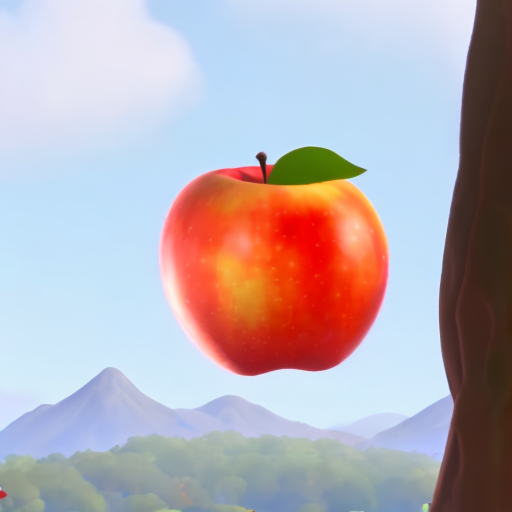

In [26]:
prompt = "modern disney, an apple falling from a tree, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

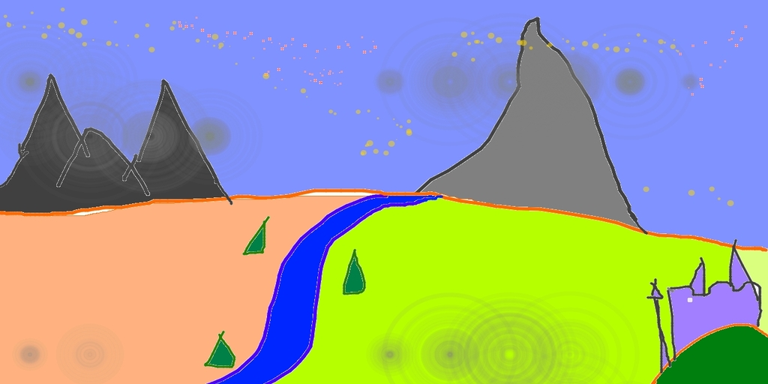

In [27]:
init_img = Image.open('./img/sketch_mountains.jpg')
init_img.thumbnail((768,768))
init_img

  0%|          | 0/37 [00:00<?, ?it/s]

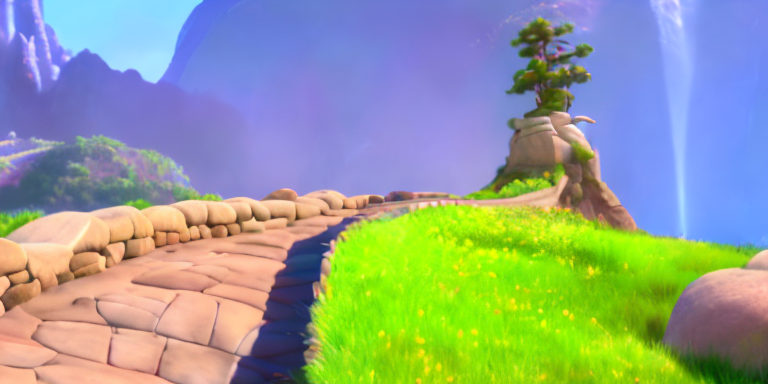

In [28]:
prompt = "modern disney, a fantasy landscape with mountains"
generator = torch.Generator(device=device).manual_seed(seed)
image = modi(prompt=prompt, image=init_img, strength=0.75, generator=generator).images[0]
image

  0%|          | 0/37 [00:00<?, ?it/s]

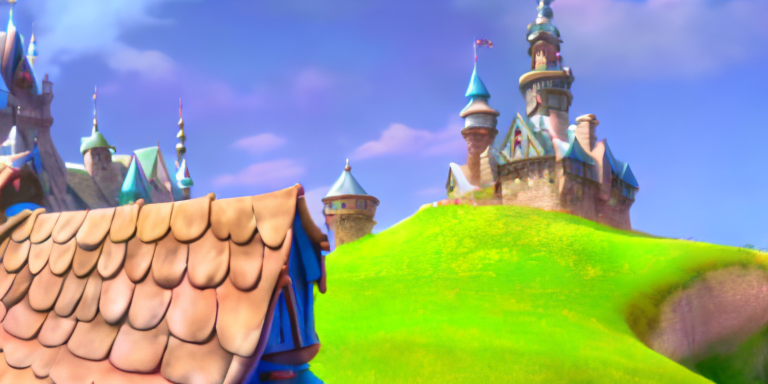

In [29]:
prompt = "modern disney, a fantasy landscape with castles"
generator = torch.Generator(device=device).manual_seed(seed)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

> Other seed

In [30]:
prompt = "modern disney, a fantasy landscape with mountains"

generator = torch.Generator(device=device).manual_seed(1024)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

  0%|          | 0/37 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
prompt = "modern disney, a fantasy landscape with castles"

generator = torch.Generator(device=device).manual_seed(1024)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

> Other model



In [ ]:
gd = StableDiffusionImg2ImgPipeline.from_pretrained("nitrosocke/Ghibli-Diffusion", torch_dtype=torch.float16)
gd = gd.to("cuda")

In [ ]:
prompt = "ghibli style, a fantasy landscape with castles"

generator = torch.Generator(device=device).manual_seed(seed)
image = gd(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

## Changing the scheduler

In [ ]:
from diffusers import EulerAncestralDiscreteScheduler

gd.scheduler = EulerAncestralDiscreteScheduler.from_config(gd.scheduler.config)

In [ ]:
prompt = "ghibli style, a beautiful landscape with mountains and castles"
generator = torch.Generator(device=device).manual_seed(seed)
img = gd(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
img

## Image to image "editing" (InstructPix2pix)

**InstructPix2Pix** was presented in the paper: *InstructPix2Pix: Learning to Follow Image Editing Instructions* (https://arxiv.org/abs/2211.09800)

> Website and more examples: https://www.timothybrooks.com/instruct-pix2pix/



In [ ]:
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

instruct = StableDiffusionInstructPix2PixPipeline.from_pretrained("timbrooks/instruct-pix2pix", torch_dtype=torch.float16, safety_checker=None)

instruct.to("cuda")
instruct.scheduler = EulerAncestralDiscreteScheduler.from_config(instruct.scheduler.config)

In [ ]:
init_img = Image.open("./img/michelangelo.jpg")
init_img.thumbnail((512, 512))
init_img

In [ ]:
prompt = 'give him a moustache'
seed = 777
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

In [ ]:
prompt = "turn into a cyborg"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

In [ ]:
prompt = "make him wear a leather jacket"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

In [ ]:
prompt = "add sun glasses"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=result_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

In [ ]:
prompt = "turn into a galaxy"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=15, image_guidance_scale=1.2, generator=generator).images[0]
result_img

> Other image

In [ ]:
init_img = Image.open("./img/empire-state.jpg")
init_img

In [ ]:
prompt = "add fireworks in the sky"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=10, image_guidance_scale=1, generator=generator).images[0]
result_img

In [ ]:
prompt = "make it evening"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

In [ ]:
prompt = "add spaceships in the sky"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=10, image_guidance_scale=1.3, generator=generator).images[0]
result_img

In [ ]:
prompt = "turn it into an anime"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=10, image_guidance_scale=1, generator=generator).images[0]
result_img